In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import warnings

In [9]:

from sklearn.linear_model import LogisticRegression
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix,classification_report,ConfusionMatrixDisplay
import re
import nltk
import string
from nltk.corpus import stopwords
from nltk import word_tokenize, FreqDist
from nltk.stem import WordNetLemmatizer
# import spacy
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from yellowbrick.text import FreqDistVisualizer
from wordcloud import WordCloud

### import data

In [10]:
data = pd.read_csv(r"H:\Data_Science_internship\Assignments-Internship\movie genre classification\wiki_movie_plots.csv")
data.head(7)

,Release Year,Title,Origin/Ethnicity,Director,Cast,Genre,Wiki Page,Plot
0,1901,Kansas Saloon Smashers,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/Kansas_Saloon_Sm...,"A bartender is working at a saloon, serving dr..."
1,1901,Love by the Light of the Moon,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/Love_by_the_Ligh...,"The moon, painted with a smiling face hangs ov..."
2,1901,The Martyred Presidents,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/The_Martyred_Pre...,"The film, just over a minute long, is composed..."
3,1901,"Terrible Teddy, the Grizzly King",American,Unknown,NaN,unknown,"https://en.wikipedia.org/wiki/Terrible_Teddy,_...",Lasting just 61 seconds and consisting of two ...
4,1902,Jack and the Beanstalk,American,"George S. Fleming, Edwin S. Porter",NaN,unknown,https://en.wikipedia.org/wiki/Jack_and_the_Bea...,The earliest known adaptation of the classic f...
5,1903,Alice in Wonderland,American,Cecil Hepworth,May Clark,unknown,https://en.wikipedia.org/wiki/Alice_in_Wonderl...,"Alice follows a large white rabbit down a ""Rab..."
6,1903,The Great Train Robbery,American,Edwin S. Porter,NaN,western,https://en.wikipedia.org/wiki/The_Great_Train_...,The film opens with two bandits breaking into ...


In [11]:
data.rename(columns = {'Release Year':'Release_Year', 'Wiki Page':'Wiki_Page'}, inplace = True)
data.head(2)

,Release_Year,Title,Origin/Ethnicity,Director,Cast,Genre,Wiki_Page,Plot
0,1901,Kansas Saloon Smashers,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/Kansas_Saloon_Sm...,"A bartender is working at a saloon, serving dr..."
1,1901,Love by the Light of the Moon,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/Love_by_the_Ligh...,"The moon, painted with a smiling face hangs ov..."


### statistic of the data

In [12]:
data.describe()

,Release_Year
count,34886.000000
mean,1981.314252
std,27.815174
min,1901.000000
25%,1957.000000
50%,1988.000000
75%,2007.000000
max,2017.000000


In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34886 entries, 0 to 34885
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Release_Year      34886 non-null  int64 
 1   Title             34886 non-null  object
 2   Origin/Ethnicity  34886 non-null  object
 3   Director          34886 non-null  object
 4   Cast              33464 non-null  object
 5   Genre             34886 non-null  object
 6   Wiki_Page         34886 non-null  object
 7   Plot              34886 non-null  object
dtypes: int64(1), object(7)
memory usage: 2.1+ MB


In [14]:
data.shape

(34886, 8)

In [15]:
data.isnull().any()

Release_Year        False
Title               False
Origin/Ethnicity    False
Director            False
Cast                 True
Genre               False
Wiki_Page           False
Plot                False
dtype: bool

In [16]:
null_count = data.isnull().sum() 
null_persentage =  null_count*(100/len(data))  
df_null = pd.DataFrame({"Null values ":null_count, "Null value in persentage":null_persentage})
df_null

,Null values,Null value in persentage
Release_Year,0,0.000000
Title,0,0.000000
Origin/Ethnicity,0,0.000000
Director,0,0.000000
Cast,1422,4.076134
Genre,0,0.000000
Wiki_Page,0,0.000000
Plot,0,0.000000


### Data visualization and cleaning

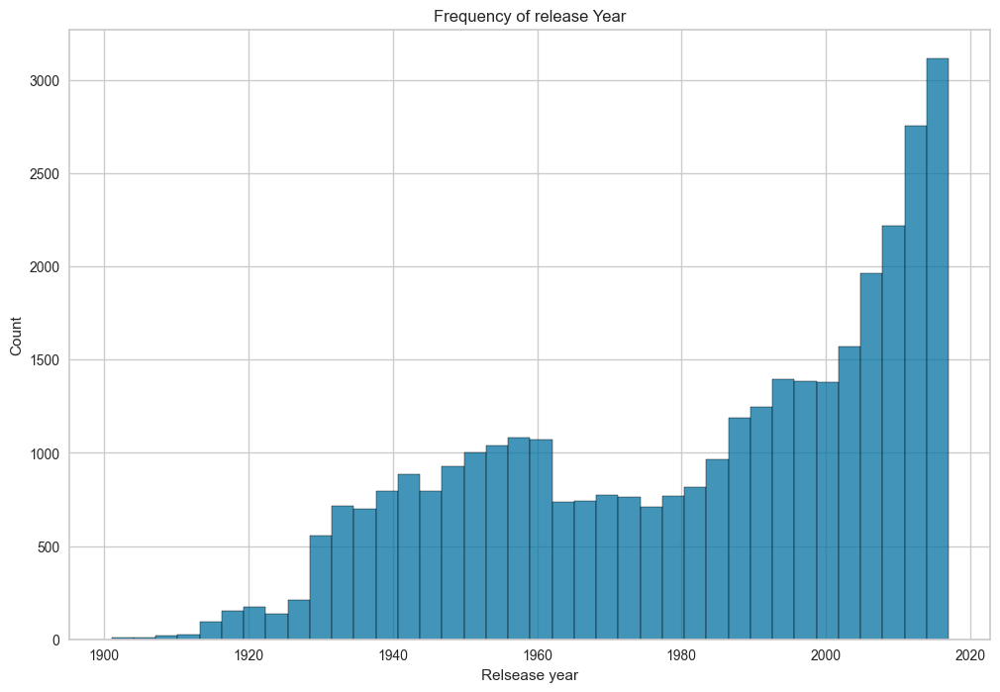

In [17]:
fig, ax = plt.subplots(figsize = (12,8))
sns.histplot(data = data, x = data['Release_Year'])
plt.title("Frequency of release Year")
plt.xlabel("Relsease year")
plt.ylabel("Count")
plt.show()

In [18]:
year = data.Release_Year.value_counts(sort=False)

In [19]:
print(len(year))

117


In [20]:
year_dict = year.to_dict()

In [21]:
year_dict #number of movie release in each year 

{1901: 4,
 1902: 1,
 1903: 2,
 1904: 1,
 1905: 2,
 1906: 3,
 1907: 3,
 1908: 6,
 1909: 4,
 1910: 10,
 1911: 7,
 1912: 8,
 1913: 10,
 1914: 45,
 1915: 24,
 1916: 26,
 1917: 35,
 1918: 61,
 1919: 57,
 1920: 70,
 1921: 61,
 1922: 44,
 1923: 38,
 1924: 45,
 1925: 55,
 1926: 57,
 1927: 56,
 1928: 100,
 1929: 145,
 1930: 188,
 1931: 223,
 1932: 243,
 1933: 229,
 1934: 244,
 1935: 260,
 1936: 204,
 1937: 237,
 1938: 213,
 1939: 269,
 1940: 315,
 1941: 311,
 1942: 300,
 1943: 274,
 1944: 284,
 1945: 253,
 1946: 256,
 1947: 288,
 1948: 322,
 1949: 316,
 1950: 317,
 1951: 355,
 1952: 328,
 1953: 361,
 1954: 336,
 1955: 343,
 1956: 365,
 1957: 383,
 1958: 333,
 1959: 293,
 1960: 268,
 1961: 257,
 1962: 251,
 1963: 245,
 1964: 261,
 1965: 230,
 1966: 235,
 1967: 248,
 1968: 259,
 1969: 243,
 1970: 245,
 1971: 284,
 1972: 280,
 1973: 246,
 1974: 238,
 1975: 230,
 1976: 217,
 1977: 264,
 1978: 254,
 1979: 261,
 1980: 253,
 1981: 272,
 1982: 289,
 1983: 256,
 1984: 302,
 1985: 333,
 1986: 328,
 1987:

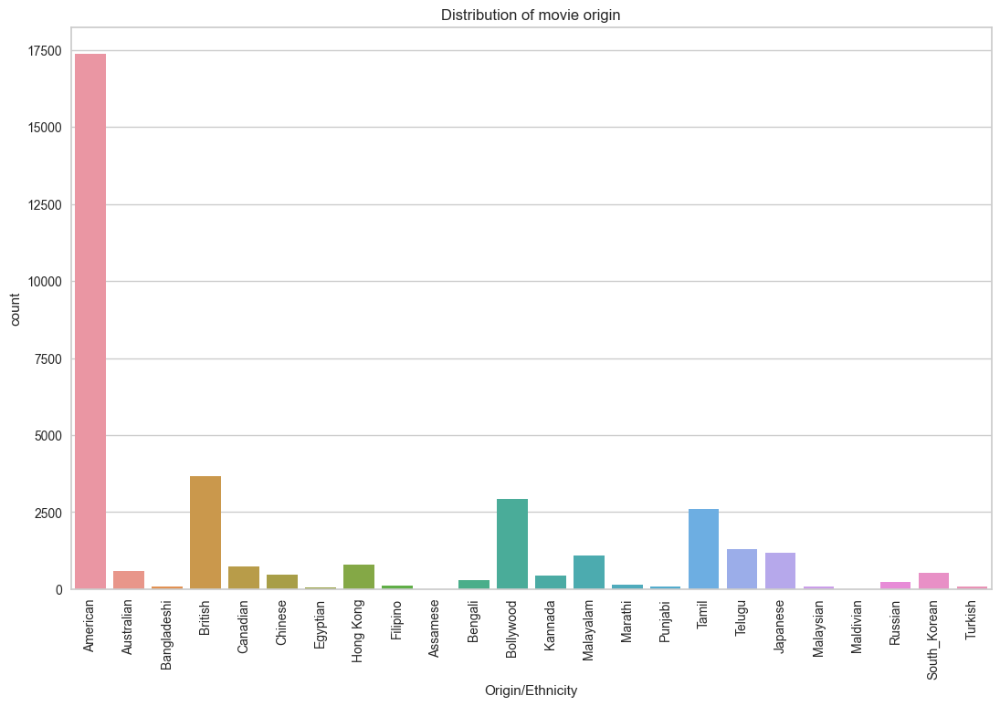

In [22]:
fig, ax = plt.subplots(figsize = (13,8))
sns.countplot(x='Origin/Ethnicity',data=data)
plt.xticks(rotation = 90)
plt.title("Distribution of movie origin")
plt.show()

In [23]:
genre_array = [genre_list.split("/") for genre_list in data['Genre']]
unique_genres = {genre.strip() for genres in genre_array for genre in genres}
unique_genres.discard('')
unique_genres

{'drama, action, crime, thriller, romance',
 'art',
 'science fiction, family',
 'social, war, action',
 'sword',
 'mythology',
 'animated, fantasy',
 'documentary, music',
 'costume',
 'action - romance',
 'crime',
 'critically acclaimed',
 'drama, social, action',
 'psychological action thriller',
 'action, adventure, epic',
 'ravi teja, jyothika',
 'mystery',
 'drama, biography',
 'fantasy, action, adventure',
 'reincarnation romance',
 'sport drama',
 'comedy, mystery',
 'drama, romance, musical',
 'biographical, drama',
 'pow comedy',
 'supernatural thriller',
 'action, suspense',
 'hockey drama',
 'fantasy-comedy',
 'politics',
 'thriller, suspense, crime',
 'horror spoof',
 'biography, drama',
 'horror, 3-d',
 'priyadarshini ram, viswendar reddy, radhika joshi',
 'sports (shogi, chess), comedy-drama',
 'world war ii drama',
 'mob, neo-noir',
 "ram, ileana d'cruz",
 'drama, romance, musical, crime',
 'drama, crime, thriller, sci-fi, action, spy',
 'drama, youth, musical, romance,

In [24]:
genra = pd.value_counts(data.Genre)
genra 

Genre
unknown                          6083
drama                            5964
comedy                           4379
horror                           1167
action                           1098
                                 ... 
cbc-tv miniseries                   1
bio-drama                           1
national film board docudrama       1
cult drama                          1
horror romantic comedy              1
Name: count, Length: 2265, dtype: int64

In [25]:
new_data = data.loc[data['Genre']!='unknown']
new_data.reset_index(drop = True,inplace = True)

In [26]:
new_genre = pd.value_counts(new_data.Genre)
new_genre

Genre
drama                            5964
comedy                           4379
horror                           1167
action                           1098
thriller                          966
                                 ... 
cbc-tv miniseries                   1
bio-drama                           1
national film board docudrama       1
cult drama                          1
horror romantic comedy              1
Name: count, Length: 2264, dtype: int64

In [27]:
top_genres = pd.DataFrame(new_genre[0:10]).reset_index() 
top_genres.columns = ['Genre','Number_Of_Movies']
top_genres

,Genre,Number_Of_Movies
0,drama,5964
1,comedy,4379
2,horror,1167
3,action,1098
4,thriller,966
5,romance,923
6,western,865
7,crime,568
8,adventure,526
9,musical,467


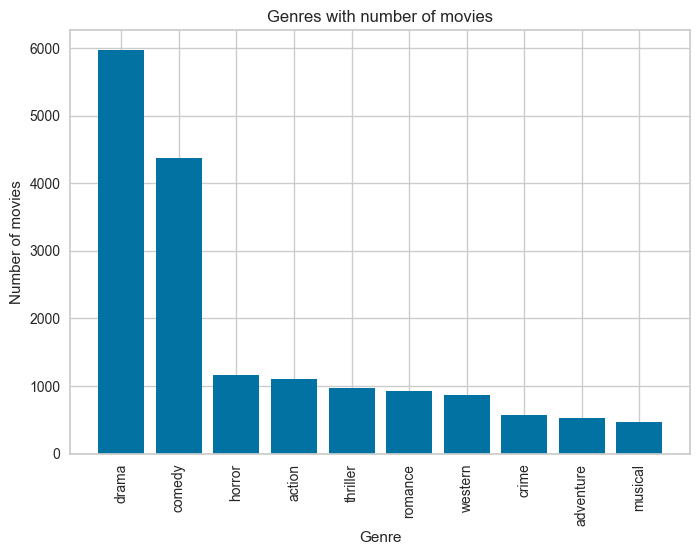

In [28]:
plt.bar(top_genres['Genre'],top_genres['Number_Of_Movies'])
plt.xticks(rotation = 90)
plt.xlabel("Genre")
plt.ylabel("Number of movies")
plt.title("Genres with number of movies")
plt.show()

In [29]:
# TAKE ONLY POPULAR 10 GENRES IN A NEW DATA FRAME 
genres_to_filter = ["drama","comedy","horror","action","thriller","western","adventure","musical", "crime", "romance"]

filtered_data = new_data[new_data['Genre'].isin(genres_to_filter)]

In [30]:
filtered_data.head()

,Release_Year,Title,Origin/Ethnicity,Director,Cast,Genre,Wiki_Page,Plot
0,1903,The Great Train Robbery,American,Edwin S. Porter,NaN,western,https://en.wikipedia.org/wiki/The_Great_Train_...,The film opens with two bandits breaking into ...
1,1904,The Suburbanite,American,Wallace McCutcheon,NaN,comedy,https://en.wikipedia.org/wiki/The_Suburbanite,The film is about a family who move to the sub...
6,1907,How Brown Saw the Baseball Game,American,Unknown,Unknown,comedy,https://en.wikipedia.org/wiki/How_Brown_Saw_th...,Before heading out to a baseball game at a nea...
7,1907,Laughing Gas,American,Edwin Stanton Porter,"Bertha Regustus, Edward Boulden",comedy,https://en.wikipedia.org/wiki/Laughing_Gas_(fi...,The plot is that of a black woman going to the...
8,1908,The Adventures of Dollie,American,D. W. Griffith,"Arthur V. Johnson, Linda Arvidson",drama,https://en.wikipedia.org/wiki/The_Adventures_o...,On a beautiful summer day a father and mother ...


In [31]:
filtered_data.shape

(16923, 8)

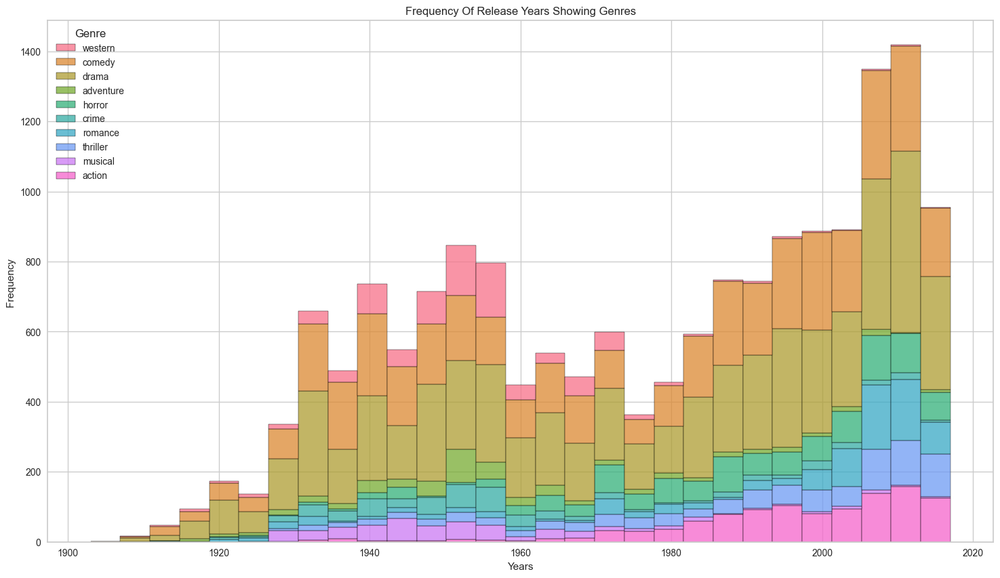

In [32]:
fig, ax = plt.subplots(figsize = (18,10))
sns.histplot(x="Release_Year",hue = 'Genre',data = filtered_data,multiple='stack')
plt.title('Frequency Of Release Years Showing Genres')
plt.xlabel("Years")
plt.ylabel("Frequency ")
plt.show()

### Drop unnecessary columns

In [33]:
filtered_data.drop(columns = ['Release_Year','Origin/Ethnicity','Director','Cast','Wiki_Page'],axis=1,inplace=True)

C:\Users\anike\AppData\Local\Temp\ipykernel_10300\4050786245.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data.drop(columns = ['Release_Year','Origin/Ethnicity','Director','Cast','Wiki_Page'],axis=1,inplace=True)


### Processing 'Plot' data

In [34]:
import nltk 
import wikipedia
from nltk import *

In [35]:
from nltk.tokenize import sent_tokenize,word_tokenize
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem import SnowballStemmer

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\anike\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [36]:
stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')

text_cleaning_re = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"

In [37]:
sentences = list(np.array(filtered_data["Plot"]))
sentences[0]

"The film opens with two bandits breaking into a railroad telegraph office, where they force the operator at gunpoint to have a train stopped and to transmit orders for the engineer to fill the locomotive's tender at the station's water tank. They then knock the operator out and tie him up. As the train stops it is boarded by the bandits\u200d—\u200cnow four. Two bandits enter an express car, kill a messenger and open a box of valuables with dynamite; the others kill the fireman and force the engineer to halt the train and disconnect the locomotive. The bandits then force the passengers off the train and rifle them for their belongings. One passenger tries to escape but is instantly shot down. Carrying their loot, the bandits escape in the locomotive, later stopping in a valley where their horses had been left.\r\nMeanwhile, back in the telegraph office, the bound operator awakens, but he collapses again. His daughter arrives bringing him his meal and cuts him free, and restores him to

In [38]:
len(sentences)

16923

In [39]:
def word_numbers(sentence):
    num_of_words = 0
    for row in sentence:
        words = [word for word in row.split(' ')]
        num_of_words += len(words)
    return num_of_words

In [40]:
word_numbers_in_whole_plot = word_numbers(sentences)
word_numbers_in_whole_plot

5966714

In [41]:
def unique_words_number(sentence):
    unique_word = set()
    for row in sentence:
        words = [word for word in row.split(' ')]
        unique_word.update(words)
    return len(unique_word)

In [42]:
unique_word_numbers_in_whole_plot = unique_words_number(sentences)
unique_word_numbers_in_whole_plot

276642

In [43]:
lem = WordNetLemmatizer() 

In [44]:
preprocessed_sentences =[]
def preprocess(text, stem=False):
    text = re.sub(text_cleaning_re, ' ', str(text).lower()).strip()
    tokens = []
    for token in text.split(): 
        token = lem.lemmatize(token,"v") #lemmatizing 
        if token not in stop_words: #remove stop_words
            if stem:
                tokens.append(stemmer.stem(token))
            else:
                tokens.append(token)
    return " ".join(tokens)

for line in sentences:
    preprocessed_line = preprocess(line)
    preprocessed_sentences.append(preprocessed_line)
list(np.array(preprocessed_sentences))

['film open two bandits break railroad telegraph office force operator gunpoint train stop transmit order engineer fill locomotive tender station water tank knock operator tie train stop board bandits four two bandits enter express car kill messenger open box valuables dynamite others kill fireman force engineer halt train disconnect locomotive bandits force passengers train rifle belong one passenger try escape instantly shoot carry loot bandits escape locomotive later stop valley horse leave meanwhile back telegraph office bind operator awaken collapse daughter arrive bring meal cut free restore consciousness douse water comic relief dance hall eastern stranger force dance locals fire feet door suddenly open telegraph operator rush tell robbery men quickly form posse overtake bandits final shootout kill recover steal mail',
 'film family move suburbs hop quiet life things start go wrong wife get violent start throw crockery lead arrest',
 'head baseball game nearby ballpark sport fan

In [45]:
len(preprocessed_sentences)

16923

In [46]:
preprocessed_sentences[0]

'film open two bandits break railroad telegraph office force operator gunpoint train stop transmit order engineer fill locomotive tender station water tank knock operator tie train stop board bandits four two bandits enter express car kill messenger open box valuables dynamite others kill fireman force engineer halt train disconnect locomotive bandits force passengers train rifle belong one passenger try escape instantly shoot carry loot bandits escape locomotive later stop valley horse leave meanwhile back telegraph office bind operator awaken collapse daughter arrive bring meal cut free restore consciousness douse water comic relief dance hall eastern stranger force dance locals fire feet door suddenly open telegraph operator rush tell robbery men quickly form posse overtake bandits final shootout kill recover steal mail'

In [47]:
word_numbers_in_preprocessed_plot = word_numbers(preprocessed_sentences)
word_numbers_in_preprocessed_plot

3361262

In [48]:
unique_word_numbers_in_preprocessed_plot = unique_words_number(preprocessed_sentences)
unique_word_numbers_in_preprocessed_plot

76841

In [49]:
print("Length of first plot data before cleaning and after cleaning ---\n","\nBefore cleaning -- ",len(sentences[0]),"\nAfter cleaning -- ",len(preprocessed_sentences[0]))

Length of first plot data before cleaning and after cleaning ---
 
Before cleaning --  1371 
After cleaning --  833


In [50]:
word_length_data = pd.DataFrame({"Index":["Before_cleaning","After Cleaning"],'Number_of_Words':[word_numbers_in_whole_plot,word_numbers_in_preprocessed_plot],'number_of_unique_Words':[unique_word_numbers_in_whole_plot,unique_word_numbers_in_preprocessed_plot]})

In [51]:
word_length_data

,Index,Number_of_Words,number_of_unique_Words
0,Before_cleaning,5966714,276642
1,After Cleaning,3361262,76841


In [52]:
x =np.array(word_length_data['Index'])
x

array(['Before_cleaning', 'After Cleaning'], dtype=object)

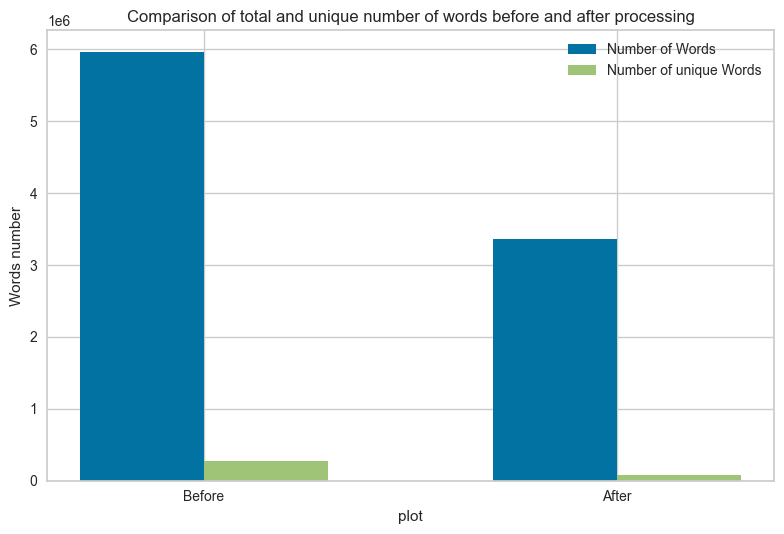

In [53]:
x= word_length_data['Index']
#y-axis
y1 = np.array(word_length_data['Number_of_Words'])
y2 = np.array(word_length_data['number_of_unique_Words'])
 
#bar chart properties
x = np.arange(2)
width = 0.3
 
#draw grouped bar chart
fig, ax = plt.subplots()
bar1 = ax.bar(x, y1, width, label='Number of Words')
bar2 = ax.bar(x + width, y2, width, label='Number of unique Words')


plt.ylabel('Words number')
plt.xlabel('plot')
plt.title('Comparison of total and unique number of words before and after processing')
plt.xticks(x+width/2,("Before","After"))
ax.legend()

fig.tight_layout()

plt.show()


### Tokenization

In [54]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_sentences)

word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Vocabulary Size : 76842


In [55]:
len(word_index)

76841

In [56]:
list(word_index)[0:10]

['find', 'take', 'go', 'get', 'leave', 'tell', 'kill', 'one', 'make', 'father']

In [57]:
#CREATE A DATA FRAME WITH PREPROCESSED_PLOT

In [58]:
filtered_data['preprocessed_plot'] = preprocessed_sentences

C:\Users\anike\AppData\Local\Temp\ipykernel_10300\2284820171.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['preprocessed_plot'] = preprocessed_sentences


In [59]:
filtered_data.head()

,Title,Genre,Plot,preprocessed_plot
0,The Great Train Robbery,western,The film opens with two bandits breaking into ...,film open two bandits break railroad telegraph...
1,The Suburbanite,comedy,The film is about a family who move to the sub...,film family move suburbs hop quiet life things...
6,How Brown Saw the Baseball Game,comedy,Before heading out to a baseball game at a nea...,head baseball game nearby ballpark sport fan m...
7,Laughing Gas,comedy,The plot is that of a black woman going to the...,plot black woman go dentist toothache give lau...
8,The Adventures of Dollie,drama,On a beautiful summer day a father and mother ...,beautiful summer day father mother take daught...


### Distribution of Words in preprocessed_plot and movie title for each genre

### Drama

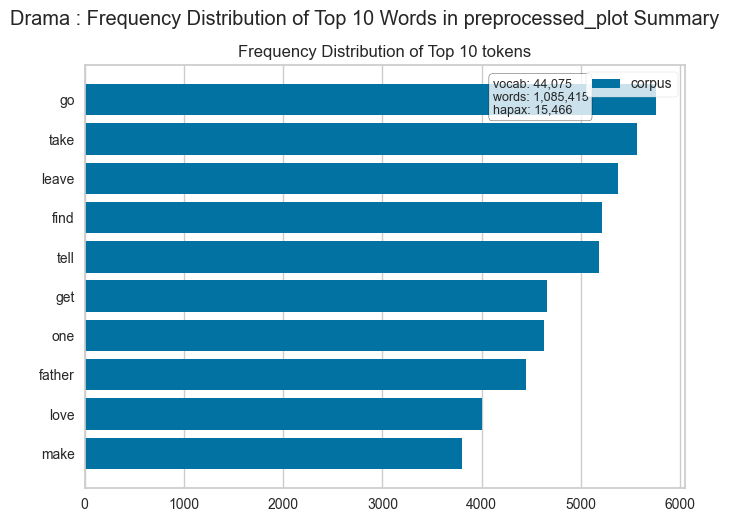

<Axes: title={'center': 'Frequency Distribution of Top 10 tokens'}>

In [60]:
#DRAMA 
drama_plot = filtered_data.loc[filtered_data['Genre'] == 'drama', ['preprocessed_plot', 'Title']]
drama_plotlist = [x for x in drama_plot['preprocessed_plot'].str.split()]
drama_plotlist = list(itertools.chain(*drama_plotlist))

count = CountVectorizer()
docs       = count.fit_transform(drama_plotlist)
features   = count.get_feature_names_out()


plt.suptitle('Drama : Frequency Distribution of Top 10 Words in preprocessed_plot Summary')
plt.yticks()
plt.xticks()
plt.gcf().subplots_adjust(left=0.15)

visualizer = FreqDistVisualizer(features = features, n=10, orient='h')
visualizer.fit(docs)
visualizer.show()

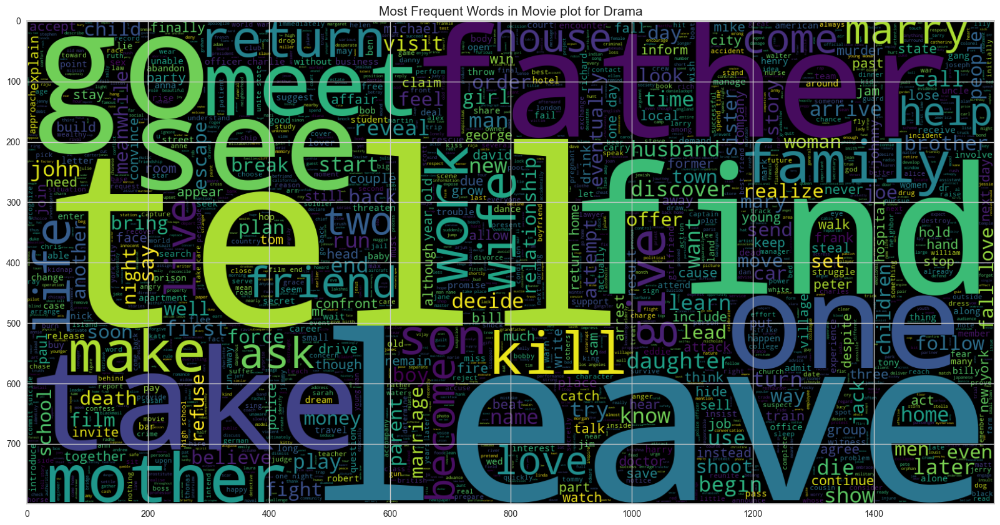

In [61]:

plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(filtered_data[filtered_data.Genre == 'drama'].preprocessed_plot))
plt.title("Most Frequent Words in Movie plot for Drama",fontsize=15)
plt.imshow(wc,interpolation = 'bilinear')
plt.show()

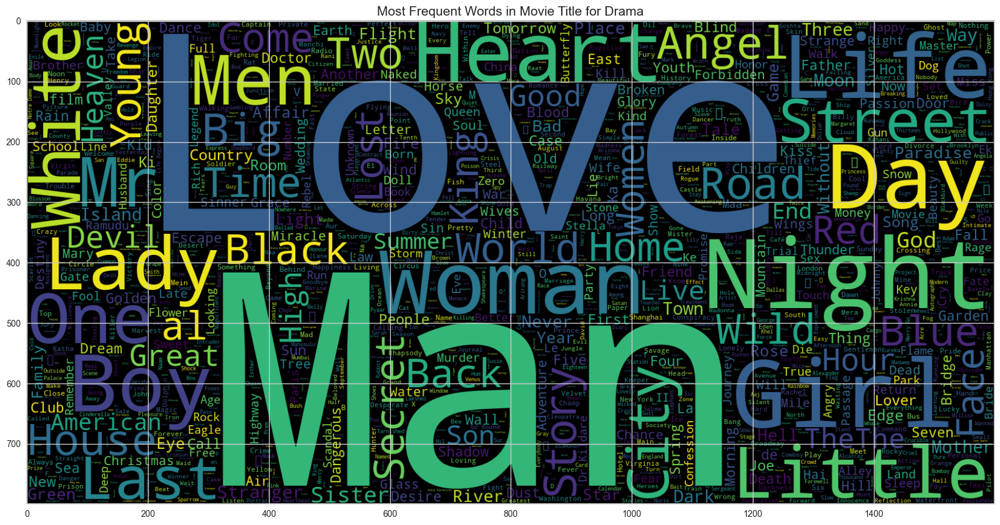

In [62]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(filtered_data[filtered_data.Genre == 'drama'].Title))
plt.title("Most Frequent Words in Movie Title for Drama",fontsize=15)
plt.imshow(wc,interpolation = 'bilinear')
plt.show()

### Comedy

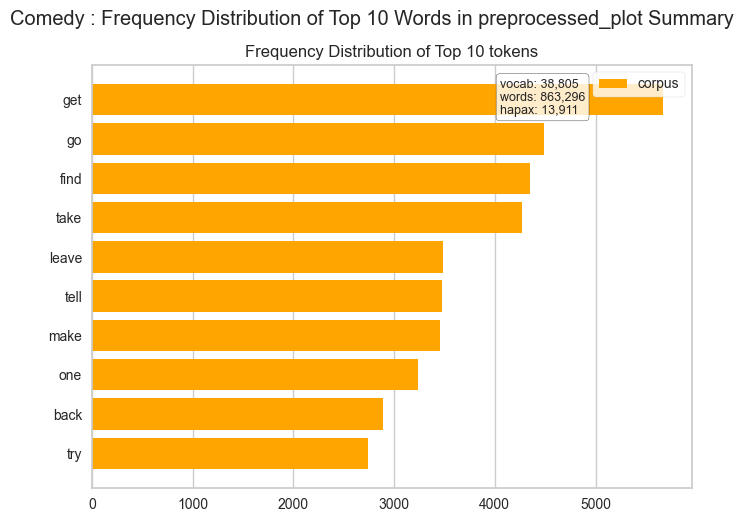

In [63]:
#COMEDY
comedy_plot = filtered_data.loc[filtered_data['Genre'] == 'comedy', ['preprocessed_plot', 'Title']]
comedy_plotlist = [x for x in comedy_plot['preprocessed_plot'].str.split()]
comedy_plotlist = list(itertools.chain(*comedy_plotlist))

count = CountVectorizer()
docs       = count.fit_transform(comedy_plotlist)
features   = count.get_feature_names_out()


plt.suptitle('Comedy : Frequency Distribution of Top 10 Words in preprocessed_plot Summary')
plt.yticks()
plt.xticks()
plt.gcf().subplots_adjust(left=0.15)

visualizer = FreqDistVisualizer(features = features, n=10, orient='h',color = 'orange')
visualizer.fit(docs)
visualizer.show()
plt.show()

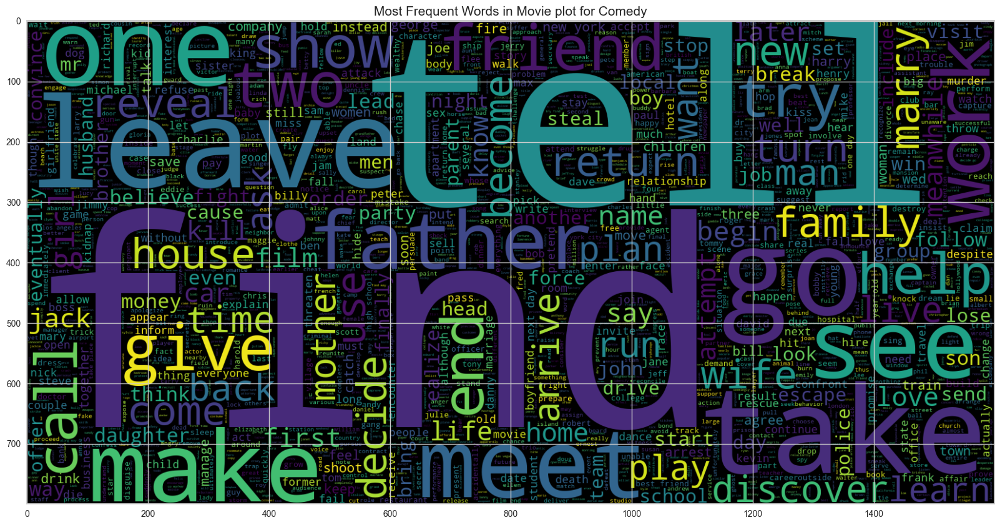

In [64]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(filtered_data[filtered_data.Genre == 'comedy'].preprocessed_plot))
plt.title("Most Frequent Words in Movie plot for Comedy",fontsize=15)
plt.imshow(wc,interpolation = 'bilinear')
plt.show()

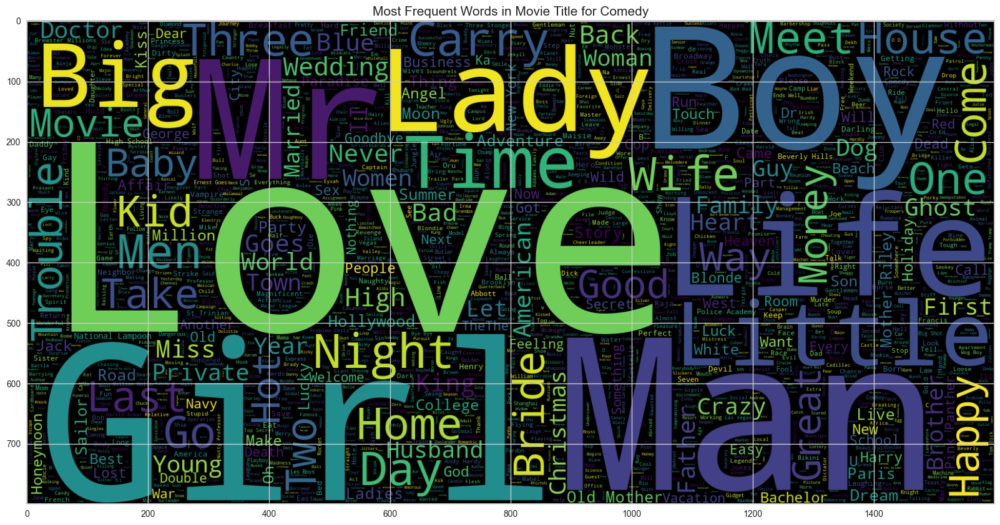

In [65]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(filtered_data[filtered_data.Genre == 'comedy'].Title))
plt.title("Most Frequent Words in Movie Title for Comedy",fontsize=15)
plt.imshow(wc,interpolation = 'bilinear')
plt.show()

### Horror

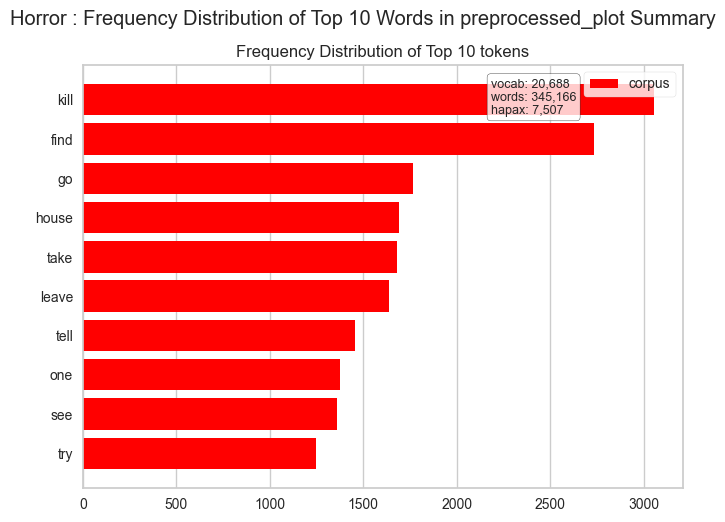

In [66]:
#HORROR
horror_plot = filtered_data.loc[filtered_data['Genre'] == 'horror', ['preprocessed_plot', 'Title']]
horror_plotlist = [x for x in horror_plot['preprocessed_plot'].str.split()]
horror_plotlist = list(itertools.chain(*horror_plotlist))

count = CountVectorizer()
docs       = count.fit_transform(horror_plotlist)
features   = count.get_feature_names_out()


plt.suptitle('Horror : Frequency Distribution of Top 10 Words in preprocessed_plot Summary')
plt.yticks()
plt.xticks()
plt.gcf().subplots_adjust(left=0.15)

visualizer = FreqDistVisualizer(features = features, n=10, orient='h',color = 'red')
visualizer.fit(docs)
visualizer.show()
plt.show()

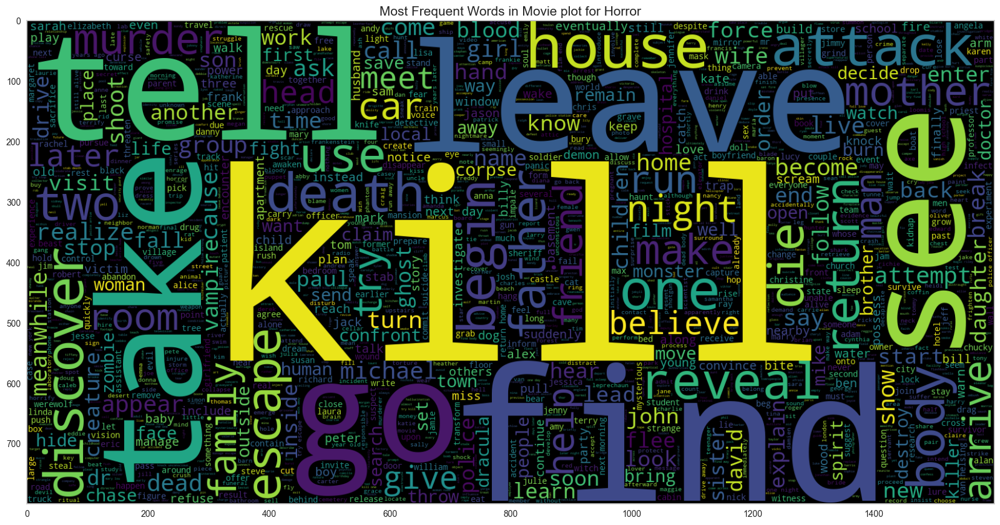

In [67]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(filtered_data[filtered_data.Genre == 'horror'].preprocessed_plot))
plt.title("Most Frequent Words in Movie plot for Horror",fontsize=15)
plt.imshow(wc,interpolation = 'bilinear')
plt.grid(False)
plt.show()

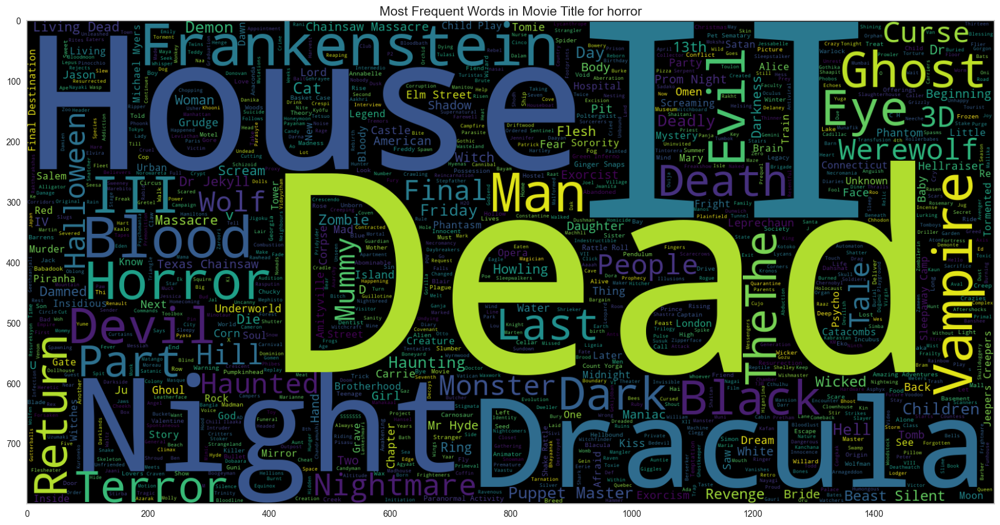

In [68]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(filtered_data[filtered_data.Genre == 'horror'].Title))
plt.title("Most Frequent Words in Movie Title for horror",fontsize=15)
plt.imshow(wc,interpolation = 'bilinear')
plt.grid(False)
plt.show()

### TF-IDF Vectorization

In [69]:
vectorizer = TfidfVectorizer(max_features=1000, ngram_range=(1, 2), stop_words='english')
X = vectorizer.fit_transform(filtered_data['preprocessed_plot'],filtered_data['Title'])
Y = filtered_data['Genre']

In [70]:
from sklearn.feature_extraction.text import TfidfVectorizer

corpus = preprocessed_sentences 

#create TfidVectorizer object
tfidf = TfidfVectorizer()

#compute a sparse matrix of word vectors for the corpus
tfidf_matrix = tfidf.fit_transform(corpus)

#display property of sparse matrix 
tfidf_matrix

# convert this sparse matrix to a dense numpy array , so that we can create a data frame for display purposes only
df = pd.DataFrame(tfidf_matrix.toarray(),columns = tfidf.get_feature_names_out())
print(df)

        00  000  0000  000th  003  006  007  00am  00pm   01  ...  zweli  \
0      0.0  0.0   0.0    0.0  0.0  0.0  0.0   0.0   0.0  0.0  ...    0.0   
1      0.0  0.0   0.0    0.0  0.0  0.0  0.0   0.0   0.0  0.0  ...    0.0   
2      0.0  0.0   0.0    0.0  0.0  0.0  0.0   0.0   0.0  0.0  ...    0.0   
3      0.0  0.0   0.0    0.0  0.0  0.0  0.0   0.0   0.0  0.0  ...    0.0   
4      0.0  0.0   0.0    0.0  0.0  0.0  0.0   0.0   0.0  0.0  ...    0.0   
...    ...  ...   ...    ...  ...  ...  ...   ...   ...  ...  ...    ...   
16918  0.0  0.0   0.0    0.0  0.0  0.0  0.0   0.0   0.0  0.0  ...    0.0   
16919  0.0  0.0   0.0    0.0  0.0  0.0  0.0   0.0   0.0  0.0  ...    0.0   
16920  0.0  0.0   0.0    0.0  0.0  0.0  0.0   0.0   0.0  0.0  ...    0.0   
16921  0.0  0.0   0.0    0.0  0.0  0.0  0.0   0.0   0.0  0.0  ...    0.0   
16922  0.0  0.0   0.0    0.0  0.0  0.0  0.0   0.0   0.0  0.0  ...    0.0   

       zwey  zwittau  zwolinski  zyaada  zygota  zyklon  zylberstein  zyprexa  \
0     

In [71]:
from sklearn.metrics.pairwise import cosine_similarity
#to see similerities 
corpus = preprocessed_sentences 

#create TfidfVectorizer
tfidf = TfidfVectorizer()

#compute a sparse matrix of word vectors for the corpus 
tfidf_matrix = tfidf.fit_transform(corpus)

#compute and print the cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix,tfidf_matrix)
print(cosine_sim)

[[1.         0.00435232 0.00606111 ... 0.01262219 0.00659377 0.00100704]
 [0.00435232 1.         0.00751239 ... 0.01806044 0.         0.00941639]
 [0.00606111 0.00751239 1.         ... 0.00829024 0.         0.00259627]
 ...
 [0.01262219 0.01806044 0.00829024 ... 1.         0.00148652 0.01077048]
 [0.00659377 0.         0.         ... 0.00148652 1.         0.        ]
 [0.00100704 0.00941639 0.00259627 ... 0.01077048 0.         1.        ]]


### Train Test Split

In [72]:
filtered_data.head(2)

,Title,Genre,Plot,preprocessed_plot
0,The Great Train Robbery,western,The film opens with two bandits breaking into ...,film open two bandits break railroad telegraph...
1,The Suburbanite,comedy,The film is about a family who move to the sub...,film family move suburbs hop quiet life things...


In [73]:
train_data, test_data = train_test_split(filtered_data, test_size=0.3,
                                         random_state=7) # Splits Dataset into Training and Testing set
print("Train Data size:", len(train_data))
print("Test Data size", len(test_data))

Train Data size: 11846
Test Data size 5077


In [74]:
X.shape

(16923, 1000)

In [75]:
Y.shape

(16923,)

In [107]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size = 0.3,random_state = 42)

In [108]:
print("Total sample in x_train : ",X_train.shape[0],"\nTotal sample in x_test : ",X_test.shape[0],"\nTotal sample of y_train : ",Y_train.shape[0],"\nTotal sample of y_test : ",Y_test.shape[0])

Total sample in x_train :  11846 
Total sample in x_test :  5077 
Total sample of y_train :  11846 
Total sample of y_test :  5077


### Model_1: Logistic Regression

In [78]:
model_1 = LogisticRegression(max_iter=10000, random_state=42)

In [79]:
model_1.fit(X_train, Y_train)

LogisticRegression(max_iter=10000, random_state=42)

In [80]:
Y_pred_1 = model_1.predict(X_test)

In [81]:
len(Y_pred_1)

5077

In [82]:
model_1_acc = accuracy_score(Y_test,Y_pred_1)
print ("Accuracy from Logistic Regression = ",model_1_acc*100)

Accuracy from Logistic Regression =  55.603702974197354


In [83]:
df_y = pd.DataFrame({"Actual_Y_value":Y_test,"Predicted":Y_pred_1})
df_y

,Actual_Y_value,Predicted
21370,horror,horror
5893,drama,drama
15963,drama,drama
21379,comedy,musical
17247,drama,drama
...,...,...
18681,drama,drama
19397,drama,comedy
24739,comedy,drama
28644,comedy,drama


### Model_2: Support Vector

In [84]:
model_2 = SVC(random_state=42)

In [85]:
model_2.fit(X_train,Y_train)

SVC(random_state=42)

In [86]:
Y_pred_2 = model_2.predict(X_test)

In [87]:
model_2_acc = accuracy_score(Y_test,Y_pred_2)
print ("Accuracy from Support vector = ",model_2_acc*100)

Accuracy from Support vector =  54.579476068544416


### Model_3: KNN Classification

In [88]:
model_3 = KNeighborsClassifier()

In [89]:
model_3.fit(X_train,Y_train)

KNeighborsClassifier()

In [90]:
Y_pred_3 = model_3.predict(X_test)

In [91]:
model_3_acc = accuracy_score(Y_test,Y_pred_3)
print ("Accuracy from KNN classification = ",model_3_acc*100)

Accuracy from KNN classification =  33.720701201496944


### Model_4: Random Forest Classifier

In [92]:
model_4 = RandomForestClassifier(random_state=0,n_estimators=10)

In [93]:
model_4.fit(X_train,Y_train)

RandomForestClassifier(n_estimators=10, random_state=0)

In [94]:
Y_pred_4 = model_4.predict(X_test)

In [95]:
model_4_acc = accuracy_score(Y_test,Y_pred_4)
print ("Accuracy from Random forest classification = ",model_4_acc*100)

Accuracy from Random forest classification =  42.95844002363601


In [96]:
results = pd.DataFrame({"Model":["Logistic_Regression","Support_vector","KNN_Classifier","Random Forest"],"Accuracy":[model_1_acc,model_2_acc,model_3_acc,model_4_acc]})
results

,Model,Accuracy
0,Logistic_Regression,0.556037
1,Support_vector,0.545795
2,KNN_Classifier,0.337207
3,Random Forest,0.429584


### Logistic Regression Confusion Matrix

In [97]:
cm=confusion_matrix(Y_test,Y_pred_1)

In [98]:
display_labels = ['drama','comedy','horror','action','thriller','romance','western','crime','adventure','musical']

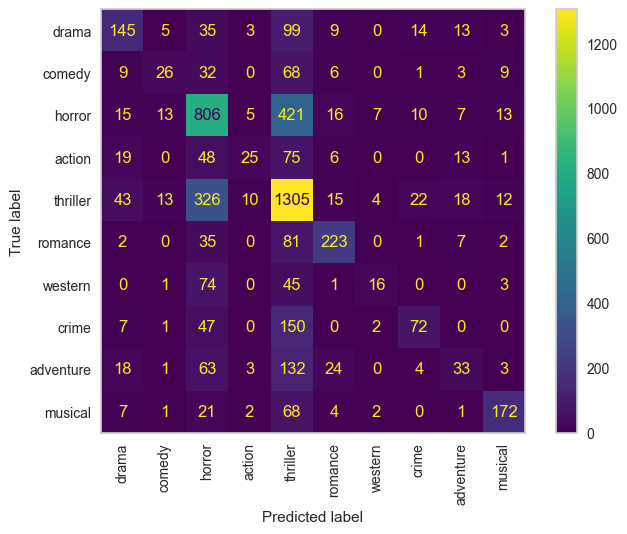

In [99]:

cm_matrix=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels= display_labels)
cm_matrix.plot()
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()